## Assignment: Oxford Flowers 102 Image Generator using GANs

Based on the provided code for training a GAN, your assignment is to build a GAN to generate realistic flower images using the Oxford Flowers 102 dataset.

**Task:**

1.  **Data Loading and Preprocessing:**
    *   Ensure the code correctly loads and preprocesses the Oxford Flowers 102 dataset using `tensorflow_datasets`, resizing images to the desired `IMAGE_SHAPE` and normalizing pixel values to [-1, 1]. The current code in cell `cINCGsobBYzc` should handle this.

2.  **Generator Architecture:**
    *   Review and potentially modify the `build_generator` function to ensure it is suitable for generating flower images. The current architecture is designed for 128x128 images and should be a good starting point. The input will be a noise vector.

3.  **Discriminator Architecture:**
    *   Review and potentially modify the `build_discriminator` function. The current architecture is designed for 128x128 images and should also be a good starting point. Its role is to distinguish between real flower images from the dataset and fake flower images generated by the generator.

4.  **Loss Functions and Optimizers:**
    *   Ensure the `generator_loss` and `discriminator_loss` functions, and the optimizers (`gen_optimizer`, `disc_optimizer`) are correctly defined for the GAN training process. The current setup in cell `kQEmbCt7BYzd` and `lVYSVXRnBYze` should be appropriate.

5.  **Training:**
    *   Use the provided `train_step` and `train` functions (potentially using the distributed training setup) to train the GAN on the preprocessed Oxford Flowers 102 dataset.

6.  **Evaluation and Visualization:**
    *   Utilize the `generate_and_show_images` function to visualize the progress of the generator during training by generating sample flower images from a fixed noise vector.
    *   After training, visually evaluate the quality and diversity of the generated flower images.

**Deliverables:**

*   The modified Python notebook with the working code for the flower image generator.
*   A brief report (can be a markdown section in the notebook) describing:
    *   Any significant modifications made to the generator or discriminator architectures.
    *   Observations during training (e.g., convergence, quality of generated images over epochs).
    *   Examples of generated flower images after training.
    *   Any challenges encountered during the process.

**Tips:**

*   Ensure the data preprocessing correctly scales and normalizes the image data.
*   Monitor the generator and discriminator losses during training to understand the GAN's progress.
*   Experiment with the number of epochs to find a good balance between training time and generated image quality.
*   Adjust hyperparameters like learning rates if needed.

In [ ]:
import tensorflow_datasets as tfds

# Load the Oxford Flowers 102 dataset
try:
    dataset, info = tfds.load('oxford_flowers102:2.1.1', with_info=True, as_supervised=True)

    # Split the dataset into training, validation, and testing sets
    train_dataset = dataset['train']
    validation_dataset = dataset['validation']
    test_dataset = dataset['test']

    # Print information about the dataset
    print(info)

except Exception as e:
    print(f"Error loading dataset: {e}")

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/3 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/oxford_flowers102/incomplete.MYSHRB_2.1.1/oxford_flowers102-train.tfrecord…

Generating test examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/oxford_flowers102/incomplete.MYSHRB_2.1.1/oxford_flowers102-test.tfrecord*…

Generating validation examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/oxford_flowers102/incomplete.MYSHRB_2.1.1/oxford_flowers102-validation.tfr…

Dataset oxford_flowers102 downloaded and prepared to /root/tensorflow_datasets/oxford_flowers102/2.1.1. Subsequent calls will reuse this data.
tfds.core.DatasetInfo(
    name='oxford_flowers102',
    full_name='oxford_flowers102/2.1.1',
    description="""
    The Oxford Flowers 102 dataset is a consistent of 102 flower categories commonly
    occurring in the United Kingdom. Each class consists of between 40 and 258
    images. The images have large scale, pose and light variations. In addition,
    there are categories that have large variations within the category and several
    very similar categories.
    
    The dataset is divided into a training set, a validation set and a test set. The
    training set and validation set each consist of 10 images per class (totalling
    1020 images each). The test set consists of the remaining 6149 images (minimum
    20 per class).
    
    Note: The dataset by default comes with a test size larger than the train size.
    For more info see

In [ ]:
import tensorflow_datasets as tfds
import os

# Assuming dataset and info were loaded in a previous cell (e.g., WeOZh0QbT2Qv)
# If not, you need to run that cell first.
# For demonstration, we'll assume 'info' is available.
# If 'info' is not available, you might need to re-run the cell that loads the dataset.

# The specific location for the Oxford Flowers 102 dataset
# Use info.data_dir from the loaded dataset information
if 'info' in locals():
    dataset_dir = info.data_dir
    print(f"Oxford Flowers 102 storage location: {dataset_dir}")

    # Optional: List the contents to verify files are present
    print(f"\nContents of {dataset_dir}:")
    try:
        print(os.listdir(dataset_dir))
    except FileNotFoundError:
        print("Directory not found. Please run the tfds.load() command first.")
else:
    print("Dataset info ('info' object) not found. Please run the cell that loads the dataset first.")

Oxford Flowers 102 storage location: /root/tensorflow_datasets/oxford_flowers102/2.1.1

Contents of /root/tensorflow_datasets/oxford_flowers102/2.1.1:
['oxford_flowers102-test.tfrecord-00000-of-00002', 'label.labels.txt', 'dataset_info.json', 'oxford_flowers102-validation.tfrecord-00000-of-00001', 'features.json', 'oxford_flowers102-test.tfrecord-00001-of-00002', 'oxford_flowers102-train.tfrecord-00000-of-00001']


In [ ]:
# The final image directory path
images_path = '/root/tensorflow_datasets/oxford_flowers102/2.1.1'
# Check if the directory exists
if os.path.exists(images_path):
    print(f"\nDirectory found: {images_path}")

    # List the files and count them
    image_files = os.listdir(images_path)
    count = len(image_files)

    print(f"Total number of files found: {count}")

    # Verify the count is correct
    if count == 202599:
        print("Verification SUCCESS: All 202,599 images were found.")
    else:
        print(f"Verification WARNING: Expected 202,599 images, but found {count}. The download may be incomplete or structured differently.")

    # Print the first 5 file names to inspect
    print("\nFirst 5 image files:")
    for filename in image_files[:5]:
        print(filename)
else:
    print(f"\nVerification FAILED: Directory not found at {images_path}")


Directory found: /root/tensorflow_datasets/oxford_flowers102/2.1.1
Total number of files found: 7
Verification WARNING: Expected 202,599 images, but found 7. The download may be incomplete or structured differently.

First 5 image files:
oxford_flowers102-test.tfrecord-00000-of-00002
label.labels.txt
dataset_info.json
oxford_flowers102-validation.tfrecord-00000-of-00001
features.json


In [ ]:
import os
import time
from tqdm import tqdm
import numpy as np
import tensorflow as tf
import tensorflow_datasets as tfds # Import tfds
from tensorflow.keras import layers
import matplotlib.pyplot as plt

IMAGE_SHAPE = (128, 128, 3)
NOISE_DIM = 100
BATCH_SIZE = 128
EPOCHS = 50
# DATA_PATH = '/content/celeba-dataset/img_align_celeba/img_align_celeba/' # Remove CelebA path

def preprocess_image(image, label): # Modify preprocess_image to accept image and label
    img = tf.image.resize(image, (IMAGE_SHAPE[0], IMAGE_SHAPE[1]))
    img = (img / 127.5) - 1.0  # Normalize to [-1, 1]
    return img # Return only the processed image

# Modify load_celeba_images to load from tfds
# def load_celeba_images(path):
#     all_files = [os.path.join(path, f) for f in os.listdir(path)[:10000] if f.endswith('.jpg')]
#     dataset = tf.data.Dataset.from_tensor_slices(all_files)
#     dataset = dataset.map(preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)

#     images_list = []
#     for batch in tqdm(dataset.batch(1024).prefetch(tf.data.AUTOTUNE)):
#         images_list.append(batch)

#     return tf.concat(images_list, axis=0)

# Load the Oxford Flowers 102 dataset using tfds
try:
    # Load the dataset with as_supervised=True to get (image, label) pairs
    dataset, info = tfds.load('oxford_flowers102:2.1.1', with_info=True, as_supervised=True)

    # Use the training split for GAN training
    train_dataset = dataset['train']

    # Apply the preprocessing function to the dataset
    train_dataset = train_dataset.map(preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)

    # Shuffle and batch the dataset
    dataset = train_dataset.shuffle(buffer_size=1000).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE) # Adjust buffer_size as needed

    print("Oxford Flowers 102 dataset loaded and preprocessed.")
    # print(info) # Optional: Print dataset info

except Exception as e:
    print(f"Error loading dataset: {e}")

# The 'dataset' variable now holds the preprocessed and batched training data

Oxford Flowers 102 dataset loaded and preprocessed.


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers

def build_generator(NOISE_DIM=NOISE_DIM):
    model = tf.keras.Sequential([
        # 1) Start with a dense layer that reshapes to 8x8 with 512 channels
        layers.Dense(8*8*512, use_bias=False, input_shape=(NOISE_DIM,)),
        layers.Reshape((8, 8, 512)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        # 2) Upsample to 16x16
        layers.Conv2DTranspose(256, (4,4), strides=(2,2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        # 3) Upsample to 32x32
        layers.Conv2DTranspose(128, (4,4), strides=(2,2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        # 4) Upsample to 64x64
        layers.Conv2DTranspose(64, (4,4), strides=(2,2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        # 5) Upsample to 128x128
        layers.Conv2DTranspose(32, (4,4), strides=(2,2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        # 6) Final layer → 128x128x3, use tanh for output in [-1,1]
        layers.Conv2DTranspose(3, (4,4), strides=(1,1), padding='same', use_bias=False, activation='tanh')
    ], name="Generator")

    return model


def build_discriminator():
    model = tf.keras.Sequential([
        # 1) Downsample from 128x128 to 64x64
        layers.Conv2D(64, (4,4), strides=(2,2), padding='same',
                      input_shape=(128,128,3)),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.3),

        # 2) Downsample to 32x32
        layers.Conv2D(128, (4,4), strides=(2,2), padding='same'),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.3),

        # 3) Downsample to 16x16
        layers.Conv2D(256, (4,4), strides=(2,2), padding='same'),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.3),

        # 4) Downsample to 8x8
        layers.Conv2D(512, (4,4), strides=(2,2), padding='same'),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.3),

        # 5) Flatten to a single logit
        layers.Flatten(),
        layers.Dense(1)
    ], name="Discriminator")

    return model

In [ ]:
generator = build_generator()
discriminator = build_discriminator()


cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

gen_optimizer = tf.keras.optimizers.Adam(1e-4)
disc_optimizer = tf.keras.optimizers.Adam(1e-4)

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.12/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


In [ ]:
def train_step(real_images):
    noise = tf.random.normal([BATCH_SIZE, NOISE_DIM])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        # Ensure shapes match
        assert generated_images.shape[1:] == IMAGE_SHAPE, "Generated image shape mismatch!"
        assert real_images.shape[1:] == IMAGE_SHAPE, "Real image shape mismatch!"

        real_output = discriminator(real_images, training=True)
        fake_output = discriminator(generated_images, training=True)

        g_loss = generator_loss(fake_output)
        d_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(g_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(d_loss, discriminator.trainable_variables)

    gen_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    disc_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return g_loss, d_loss


def generate_and_show_images(noise):
    # Generate images
    preds = generator(noise, training=False)
    preds = (preds + 1) / 2.0  # Shift from [-1,1] to [0,1]

    # Plot
    fig = plt.figure(figsize=(4,4))
    for i in range(preds.shape[0]):
        plt.subplot(4,4,i+1)
        plt.imshow(preds[i])
        plt.axis('off')
    plt.show()

In [ ]:
def train(dataset, epochs):
    fixed_noise = tf.random.normal([16, NOISE_DIM])  # Fixed noise for generating sample images
    total_start_time = time.time()  # Start time for total training

    # Lists to store losses for plotting
    generator_losses = []
    discriminator_losses = []

    for epoch in range(epochs):
        epoch_start_time = time.time()  # Start time for the current epoch

        g_losses = []
        d_losses = []

        for image_batch in dataset:
            g_loss, d_loss = train_step(image_batch)
            g_losses.append(g_loss.numpy()) # Store loss as numpy value
            d_losses.append(d_loss.numpy()) # Store loss as numpy value

        # Calculate average losses for the epoch
        avg_g_loss = np.mean(g_losses)
        avg_d_loss = np.mean(d_losses)

        # Append average losses to lists
        generator_losses.append(avg_g_loss)
        discriminator_losses.append(avg_d_loss)


        # Time taken for the epoch
        epoch_end_time = time.time()
        epoch_duration = epoch_end_time - epoch_start_time

        # Print epoch details
        print(f"Epoch {epoch+1}/{epochs} | "
              f"Generator loss: {avg_g_loss:.4f}, "
              f"Discriminator loss: {avg_d_loss:.4f} | "
              f"Time: {epoch_duration:.2f} seconds")

        # Generate and show images for the current epoch
        generate_and_show_images(fixed_noise)

        # Plot losses after each epoch
        plt.figure(figsize=(10, 5))
        plt.plot(generator_losses, label='Generator Loss')
        plt.plot(discriminator_losses, label='Discriminator Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('GAN Training Losses per Epoch')
        plt.legend()
        plt.grid(True)
        plt.show()


    # Total time taken for training
    total_end_time = time.time()
    total_duration = total_end_time - total_start_time
    print(f"\nTotal Training Time: {total_duration:.2f} seconds")

In [ ]:
import tensorflow as tf
# Remove the distributed training setup
# strategy = tf.distribute.MirroredStrategy(devices=["/gpu:0", "/gpu:1"])

# with strategy.scope():
generator = build_generator()
discriminator = build_discriminator()

cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

gen_optimizer = tf.keras.optimizers.Adam(1e-4)
disc_optimizer = tf.keras.optimizers.Adam(1e-4)

# Existing dataset creation
# The dataset is already batched and prefetched in the data loading cell
# dataset = tf.data.Dataset.from_tensor_slices(images).shuffle(10000).batch(BATCH_SIZE)

# Remove the distributed dataset creation
# dist_dataset = strategy.experimental_distribute_dataset(dataset)

# Remove the distributed train step
# @tf.function
# def distributed_train_step(dataset_inputs):
#     def step_fn(real_images):
#         return train_step(real_images)  # The train_step you already have

#     per_replica_g_loss, per_replica_d_loss = strategy.run(step_fn, args=(dataset_inputs,))
#     mean_g_loss = strategy.reduce(tf.distribute.ReduceOp.SUM, per_replica_g_loss, axis=None)
#     mean_d_loss = strategy.reduce(tf.distribute.ReduceOp.SUM, per_replica_d_loss, axis=None)
#     return mean_g_loss, mean_d_loss


# The train function will now use the standard dataset
def train(dataset, epochs):
    fixed_noise = tf.random.normal([16, NOISE_DIM])
    total_start_time = time.time()

    # Lists to store losses for plotting
    generator_losses = []
    discriminator_losses = []

    for epoch in range(epochs):
        epoch_start_time = time.time()

        g_losses = []
        d_losses = []

        # Use the standard dataset for training
        for image_batch in dataset:
            g_loss, d_loss = train_step(image_batch)
            g_losses.append(g_loss.numpy()) # Store loss as numpy value
            d_losses.append(d_loss.numpy()) # Store loss as numpy value


        avg_g_loss = tf.reduce_mean(g_losses)
        avg_d_loss = tf.reduce_mean(d_losses)

        # Append average losses to lists
        generator_losses.append(avg_g_loss)
        discriminator_losses.append(avg_d_loss)

        epoch_duration = time.time() - epoch_start_time
        print(f"Epoch {epoch+1}/{epochs} | "
              f"Generator loss: {avg_g_loss:.4f}, "
              f"Discriminator loss: {avg_d_loss:.4f} | "
              f"Time: {epoch_duration:.2f} s")

        generate_and_show_images(fixed_noise)

        # Plot losses after each epoch
        plt.figure(figsize=(10, 5))
        plt.plot(generator_losses, label='Generator Loss')
        plt.plot(discriminator_losses, label='Discriminator Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('GAN Training Losses per Epoch')
        plt.legend()
        plt.grid(True)
        plt.show()


    total_duration = time.time() - total_start_time
    print(f"\nTotal Training Time: {total_duration:.2f} seconds")

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.12/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


In [ ]:
train(dataset, 200)
generator.save('generator_200.h5')

In [ ]:
# Load the saved generator model (generator_200.h5)
try:
    loaded_generator = tf.keras.models.load_model('/content/generator_200.h5')
    print("Generator model 'generator_200.h5' loaded successfully.")
    generator = loaded_generator # Assign the loaded model back to the 'generator' variable
except Exception as e:
    print(f"Error loading generator model: {e}")
    print("Please ensure 'generator_200.h5' exists at the specified path and try again.")

# Recreate the discriminator model as well, as its variables are also needed for the optimizer
discriminator = build_discriminator()

# Recreate the optimizers *after* loading the models
gen_optimizer = tf.keras.optimizers.Adam(1e-4)
disc_optimizer = tf.keras.optimizers.Adam(1e-4)


# Continue training for an additional 300 epochs
print("Continuing training for another 300 epochs...")
# Assuming 'dataset' variable containing the preprocessed data is available from previous cells
train(dataset, 300)

# Save the updated generator model after further training
generator.save('generator_500.h5') # Save with a new name indicating total epochs
print("Updated generator model saved as generator_500.h5")

In [ ]:
try:
    loaded_generator = tf.keras.models.load_model('/content/generator_500.h5')
    print("Generator model 'generator_200.h5' loaded successfully.")
    generator = loaded_generator # Assign the loaded model back to the 'generator' variable
except Exception as e:
    print(f"Error loading generator model: {e}")
    print("Please ensure 'generator_500.h5' exists at the specified path and try again.")

# Recreate the discriminator model as well, as its variables are also needed for the optimizer
discriminator = build_discriminator()

# Recreate the optimizers *after* loading the models
gen_optimizer = tf.keras.optimizers.Adam(1e-4)
disc_optimizer = tf.keras.optimizers.Adam(1e-4)


# Continue training for an additional 300 epochs
print("Continuing training for another 200 epochs...")
# Assuming 'dataset' variable containing the preprocessed data is available from previous cells
train(dataset, 200)

# Save the updated generator model after further training
generator.save('generator_700.h5') # Save with a new name indicating total epochs
print("Updated generator model saved as generator_700.h5")

In [ ]:
try:
    loaded_generator = tf.keras.models.load_model('/content/generator_700.h5')
    print("Generator model 'generator_700.h5' loaded successfully.")
    generator = loaded_generator # Assign the loaded model back to the 'generator' variable
except Exception as e:
    print(f"Error loading generator model: {e}")
    print("Please ensure 'generator_700.h5' exists at the specified path and try again.")

# Recreate the discriminator model as well, as its variables are also needed for the optimizer
discriminator = build_discriminator()

# Recreate the optimizers *after* loading the models
gen_optimizer = tf.keras.optimizers.Adam(1e-4)
disc_optimizer = tf.keras.optimizers.Adam(1e-4)


# Continue training for an additional 300 epochs
print("Continuing training for another 200 epochs...")
# Assuming 'dataset' variable containing the preprocessed data is available from previous cells
train(dataset, 200)

# Save the updated generator model after further training
generator.save('generator_1100.h5') # Save with a new name indicating total epochs
print("Updated generator model saved as generator_1100.h5")

In [ ]:
try:
    loaded_generator = tf.keras.models.load_model('/content/generator_1100.h5')
    print("Generator model 'generator_1100.h5' loaded successfully.")
    generator = loaded_generator # Assign the loaded model back to the 'generator' variable
except Exception as e:
    print(f"Error loading generator model: {e}")
    print("Please ensure 'generator_1100.h5' exists at the specified path and try again.")

# Recreate the discriminator model as well, as its variables are also needed for the optimizer
discriminator = build_discriminator()

# Recreate the optimizers *after* loading the models
gen_optimizer = tf.keras.optimizers.Adam(1e-4)
disc_optimizer = tf.keras.optimizers.Adam(1e-4)


# Continue training for an additional 300 epochs
print("Continuing training for another 200 epochs...")
# Assuming 'dataset' variable containing the preprocessed data is available from previous cells
train(dataset, 200)

# Save the updated generator model after further training
generator.save('generator_1300.h5') # Save with a new name indicating total epochs
print("Updated generator model saved as generator_1300.h5")

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os

#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"

generator = tf.keras.models.load_model('/content/generator_1300.h5', compile=False)

(np.float64(-0.5), np.float64(127.5), np.float64(127.5), np.float64(-0.5))

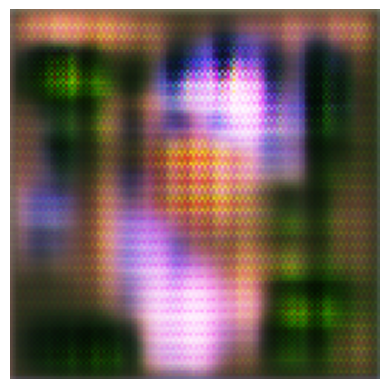

In [ ]:
noise = tf.random.normal([1, 100])
# noise += .5

with tf.device('/GPU:0'):
    generated_images = generator(noise, training=False)

generated_images = (generated_images + 1) / 2.0

plt.imshow(generated_images[0])
plt.axis('off')

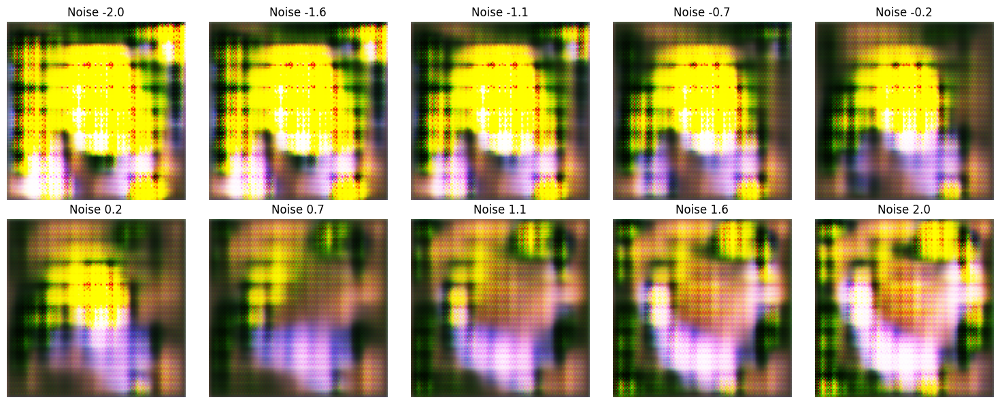

In [ ]:
def generate_variations(model, noise_dim=100, num_variations=10):

    base_noise = tf.random.normal([1, noise_dim])

    noise_modifications = np.linspace(-2, 2, num_variations)

    fig, axes = plt.subplots(2, 5, figsize=(15, 6))  # 2 rows, 5 columns

    for i, noise_offset in enumerate(noise_modifications):
        variation_noise = base_noise + noise_offset

        with tf.device('/GPU:0'):
            generated_image = model(variation_noise, training=False)

        generated_image = (generated_image + 1) / 2.0

        ax = axes[i // 5, i % 5]
        ax.imshow(generated_image[0])
        ax.axis('off')
        ax.set_title(f"Noise {noise_offset:.1f}")

    plt.tight_layout()
    plt.show()

# Generate and display variations
generate_variations(generator)

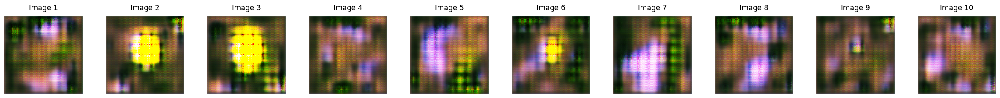

In [ ]:
def generate_images_grid(model, noise_dim=100, num_images=10):

    fig, axes = plt.subplots(1, num_images, figsize=(30, 5))  # Wider figure

    for i in range(num_images):
        noise = tf.random.normal([1, noise_dim])

        with tf.device('/GPU:0'):
            generated_image = model(noise, training=False)
        generated_image = (generated_image + 1) / 2.0

        axes[i].imshow(generated_image[0])
        axes[i].axis('off')
        axes[i].set_title(f"Image {i+1}", fontsize=12, pad=10)

    plt.subplots_adjust(wspace=0.3)
    plt.show()

# Generate and display 10 images in a spaced 1x10 layout
generate_images_grid(generator)

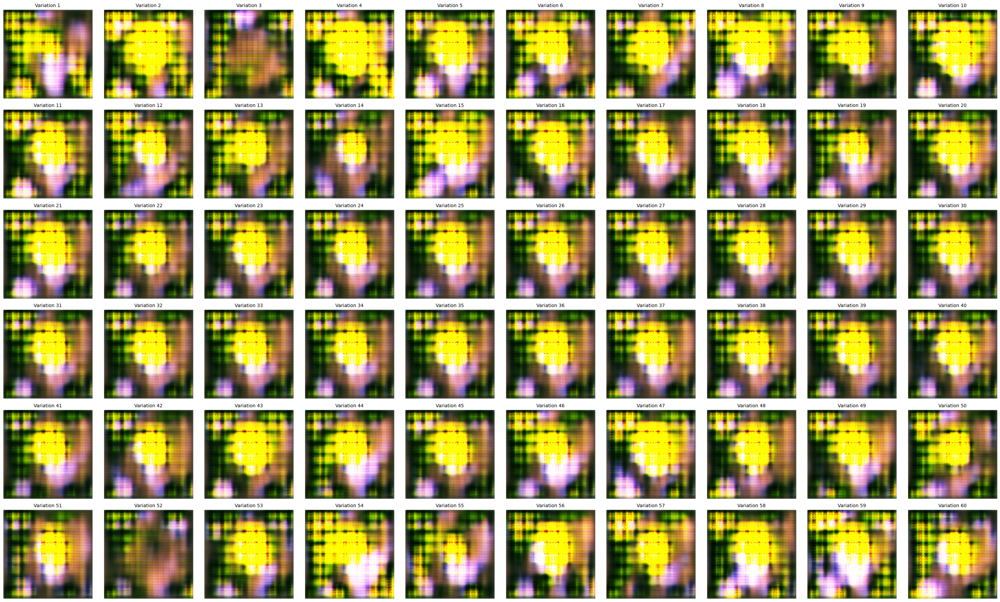

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os

# Force CPU execution
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"

# Function to generate 6x10 variations of the same base image with nonlinear noise changes
def generate_nonlinear_variations(model, noise_dim=100, rows=6, cols=10):
    base_noise = tf.random.normal([1, noise_dim])  # Base noise

    # Create nonlinear variations of noise
    noise_modifications = np.linspace(-2, 2, rows * cols) * .35 # Base values
    sinusoidal_variations = np.sin(noise_modifications) * .35  # Sinusoidal variation
    exponential_variations = (np.exp(noise_modifications / 2) - 1) * 0.35  # Exponential variation
    combined_variations = noise_modifications + sinusoidal_variations + exponential_variations  # Mix variations

    fig, axes = plt.subplots(rows, cols, figsize=(30, 18))  # 6 rows, 10 columns

    for i, noise_offset in enumerate(combined_variations):
        variation_noise = base_noise + (noise_offset * tf.random.normal([1, noise_dim]))  # Apply variation in different directions

        with tf.device('/CPU:0'):
            generated_image = model(variation_noise, training=False)

        generated_image = (generated_image + 1) / 2.0  # Rescale for visualization

        ax = axes[i // cols, i % cols]
        ax.imshow(generated_image[0])
        ax.axis('off')
        ax.set_title(f"Variation {i+1}", fontsize=10)

    plt.tight_layout()
    plt.show()

# Generate and display nonlinear variations
generate_nonlinear_variations(generator)

(np.float64(-0.5), np.float64(127.5), np.float64(127.5), np.float64(-0.5))

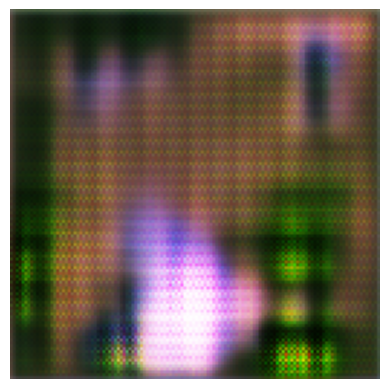

In [ ]:
noise = tf.random.normal([1, 100])

with tf.device('/GPU:0'):
    generated_images = generator(noise, training=False)

generated_images = (generated_images + 1) / 2.0

plt.imshow(generated_images[0])
plt.axis('off')

## Project Summary

This notebook implements a Generative Adversarial Network (GAN) using TensorFlow to generate images. The code includes:

-   Data loading and preprocessing (initially for CelebA, later modified for Oxford Flowers).
-   Definition of the generator and discriminator models.
-   Implementation of loss functions and optimizers.
-   A `train_step` function for updating the generator and discriminator weights.
-   A `generate_and_show_images` function to visualize the generator's progress.
-   Setup for distributed training using `tf.distribute.MirroredStrategy`.
-   A `train` function to manage the training loop over multiple epochs.
-   A final assignment suggesting modifications for image super-resolution on the CelebA dataset (this can be adapted for the Oxford Flowers dataset).

The goal of this project is to demonstrate the fundamental concepts of GANs and provide a starting point for generating synthetic images or performing image-to-image translation tasks.